# Image Captioning Demo


## Install Required Dependencies

In [1]:
!pip install transformers torch torchvision Pillow requests deep-translator

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 98.1 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 78.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 82.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 2.6 MB/s eta 0:00:00
  Attempting uninstall: nvi

## 2. Import Libraries

In [2]:
import torch
from transformers import Blip2Processor, Blip2ForConditionalGeneration,InstructBlipForConditionalGeneration,VisionEncoderDecoderModel, ViTImageProcessor, AutoTokenizer
from PIL import Image
import requests
from deep_translator import GoogleTranslator
import matplotlib.pyplot as plt
import numpy as np

2025-07-09 04:29:42.811608: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752035383.012501      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752035383.067338      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
from transformers import Blip2Processor, Blip2ForConditionalGeneration, BlipProcessor, BlipForConditionalGeneration, pipeline,InstructBlipProcessor
import os
import json
import requests
from PIL import Image
from datetime import datetime



In [4]:
from transformers import VisionEncoderDecoderModel, ViTFeatureExtractor, AutoTokenizer

In [5]:
from pycocotools.coco import COCO
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt')
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!unzip annotations_trainval2017.zip

--2025-07-09 04:29:58--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


3.5.29.163, 3.5.21.112, 3.5.12.218, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.29.163|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

annotations_trainva 100%[===================>] 241.19M  96.2MB/s    in 2.5s    

2025-07-09 04:30:01 (96.2 MB/s) - ‘annotations_trainval2017.zip’ saved [252907541/252907541]

Archive:  annotations_trainval2017.zip
  inflating: annotations/instances_train2017.json  
  inflating: annotations/instances_val2017.json  
  inflating: annotations/captions_train2017.json  
  inflating: annotations/captions_val2017.json  
  inflating: annotations/person_keypoints_train2017.json  
  inflating: annotations/person_keypoints_val2017.json  


## 3. Load Model

In [6]:
def test_blip2(image):
    """Test BLIP-2"""
    print("Loading BLIP-2")
    
    # Get device
    device = "cuda" if torch.cuda.is_available() else "cpu"
    
    model_name = "Salesforce/blip2-opt-2.7b"
    processor = Blip2Processor.from_pretrained(model_name)
    model = Blip2ForConditionalGeneration.from_pretrained(
        model_name,
        torch_dtype=torch.float16 if device == "cuda" else torch.float32,
        device_map="auto" if device == "cuda" else None
    )
    
    
    inputs = processor(image, return_tensors="pt").to(device)
    
    with torch.no_grad():
        generated_ids = model.generate(
            **inputs,
            max_length=200,
            min_length=25,
            num_beams=8,
            length_penalty=1.2,
            repetition_penalty=1.3,
            # do_sample=True,
            temperature=0.8,
            top_p=0.9,
            # early_stopping=True
        )
    
    caption = processor.decode(generated_ids[0], skip_special_tokens=True)
    print(f"BLIP-2: {caption}")
    
    # Clean up memory
    del model, processor
    torch.cuda.empty_cache() if device == "cuda" else None
    
    return caption.strip()

In [ ]:
def test_blip(image):
    
    device = "cuda" if torch.cuda.is_available() else "cpu"
    
    model_name = "Salesforce/blip-image-captioning-large"
    processor = BlipProcessor.from_pretrained(model_name)
    model = BlipForConditionalGeneration.from_pretrained(model_name).to(device)
    inputs = processor(image, return_tensors="pt").to(device)
    
    with torch.no_grad():
        generated_ids = model.generate(
            **inputs,
            max_length=200,
            min_length = 25,
            length_penalty=1.2,
            num_beams=8,
            early_stopping=True,
            repetition_penalty=1.3,
        )
    
    caption = processor.decode(generated_ids[0], skip_special_tokens=True)
    print(f"Original BLIP: {caption}")
    
    del model, processor
    torch.cuda.empty_cache() if device == "cuda" else None
    
    return caption.strip()

In [8]:
# def test_ofa(image):
#     """Test OFA model following official instructions"""
#     print("Loading OFA Model...")
    
#     from PIL import Image
#     from torchvision import transforms
#     import torch
    
#     try:
#         # Import OFA components (need to be imported after installation)
#         from transformers import OFATokenizer, OFAModel
        
#         # Get device
#         device = "cuda" if torch.cuda.is_available() else "cpu"
        
#         # Set up image preprocessing (from OFA instructions)
#         mean, std = [0.5, 0.5, 0.5], [0.5, 0.5, 0.5]
#         resolution = 480
        
#         patch_resize_transform = transforms.Compose([
#             lambda image: image.convert("RGB"),
#             transforms.Resize((resolution, resolution), interpolation=Image.BICUBIC),
#             transforms.ToTensor(), 
#             transforms.Normalize(mean=mean, std=std)
#         ])
        
#         # Model path - try multiple possible paths
#         possible_paths = ["./OFA-large", "./ofa-large", "OFA-Sys/OFA-large"]
#         ckpt_dir = None
        
#         for path in possible_paths:
#             try:
#                 tokenizer = OFATokenizer.from_pretrained(path)
#                 ckpt_dir = path
#                 break
#             except:
#                 continue
        
#         if ckpt_dir is None:
#             return "OFA model not found. Please run the installation commands first."
        
#         # Load tokenizer and model
#         tokenizer = OFATokenizer.from_pretrained(ckpt_dir)
#         model = OFAModel.from_pretrained(ckpt_dir, use_cache=False)
#         model.to(device)
        
#         # Prepare inputs - OFA expects specific format
#         txt = " what does the image describe?"
#         inputs = tokenizer([txt], return_tensors="pt").input_ids.to(device)
        
#         # Process image
#         patch_img = patch_resize_transform(image).unsqueeze(0).to(device)
        
#         # Generate caption using HuggingFace generator
#         with torch.no_grad():
#             gen = model.generate(
#                 inputs, 
#                 patch_images=patch_img, 
#                 num_beams=5, 
#                 no_repeat_ngram_size=3,
#                 max_length=100,
#                 min_length=10,
#                 early_stopping=True
#             )
        
#         # Decode result
#         caption = tokenizer.batch_decode(gen, skip_special_tokens=True)[0]
#         caption = caption.replace(txt, "").strip()  # Remove prompt
        
#         print(f"OFA Model: {caption}")
        
#         # Clean up memory
#         del model, tokenizer
#         torch.cuda.empty_cache() if device == "cuda" else None
        
#         return caption
        
#     except ImportError as e:
#         print(f"OFA import error: {e}")
#         print("Please install OFA first:")
#         print("!git clone --single-branch --branch feature/add_transformers https://github.com/OFA-Sys/OFA.git")
#         print("!pip install OFA/transformers/")
#         print("!git clone https://huggingface.co/OFA-Sys/OFA-large")
#         return "OFA not installed"
        
#     except Exception as e:
#         print(f"OFA error: {e}")
#         return "OFA model failed"

In [9]:
# def test_instructblip(image):
    
#     # model_name = "Salesforce/instructblip-vicuna-7b"
#     model_name = "Salesforce/instructblip-flan-t5-xl"
#     processor = InstructBlipProcessor.from_pretrained(model_name)
#     model = InstructBlipForConditionalGeneration.from_pretrained(model_name).to(device)
    
#     prompts = [
#         "Describe this image in great detail, including colors, objects, setting, and atmosphere.",
#         "What do you see in this image? Provide a comprehensive description.",
#         "Analyze this image and describe everything you observe, including background details."
#     ]
    
#     for prompt in prompts:
#         inputs = processor(images=image, text=prompt, return_tensors="pt").to(device)
        
#         outputs = model.generate(
#             **inputs,
#             max_length=100,     
#             min_length=20,
#             num_beams=4,
#             temperature=0.8,
#             # do_sample=True,
#             early_stopping=True,
#             rêptition_penalty=1.2
#         )
        
#         caption = processor.decode(outputs[0], skip_special_tokens=True)
#         print(f"Detailed ({prompt[:30]}...): {caption}")
#     del model, processor
#     torch.cuda.empty_cache()
#     return caption

In [10]:
def test_git_model(image):
    print("Loading GIT Model...")
    
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model_name = "microsoft/git-base-coco"
    
    processor = AutoProcessor.from_pretrained(model_name)
    model = AutoModelForCausalLM.from_pretrained( model_name, torch_dtype=torch.float16 if device == "cuda" else torch.float32).to(device)
    
    # Process image
    inputs = processor(images=image, return_tensors="pt").to(device)
    
    with torch.no_grad():
        generated_ids = model.generate(
            pixel_values=inputs.pixel_values,
            max_length=200,          
            min_length=20,         
            num_beams=8,             
            length_penalty=1.2,     
            repetition_penalty=1.2,  
            # do_sample=True,
            temperature=0.7,       
            top_p=0.9,              
            early_stopping=True,
            # pad_token_id=processor.tokenizer.eos_token_id
        )
    
    # Decode the result
    caption = processor.decode(generated_ids[0], skip_special_tokens=True)
    print(f"GIT Model: {caption}")
    
    del model, processor
    torch.cuda.empty_cache() if torch.cuda.is_available() else None
    
    return caption.strip()

In [ ]:
def test_vit_gpt2_beam(image):
    """ViT-GPT2 with beam search - properly configured"""
    print("Loading ViT-GPT2 Model with Beam Search...")
    
 
        
    model = VisionEncoderDecoderModel.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
    feature_extractor = ViTImageProcessor.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
    tokenizer = AutoTokenizer.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    
    if tokenizer.pad_token is None:
        tokenizer.pad_token = tokenizer.eos_token
    
    if image.mode != "RGB":
        image = image.convert(mode="RGB")
    
    pixel_values = feature_extractor(images=[image], return_tensors="pt").pixel_values
    pixel_values = pixel_values.to(device)
    
    gen_kwargs = {
        "max_length": 20,        
        "num_beams": 5,           
        "length_penalty": 0.8,     
        "repetition_penalty": 1.5,
        "no_repeat_ngram_size": 3,
        "early_stopping": True,
        "pad_token_id": tokenizer.pad_token_id,
        "eos_token_id": tokenizer.eos_token_id,
    }
    
    with torch.no_grad():
        output_ids = model.generate(pixel_values, **gen_kwargs)
    
    # Decode
    caption = tokenizer.decode(output_ids[0], skip_special_tokens=True)
    
    caption = caption.strip()
    caption = re.sub(r'_+', '', caption)
    caption = re.sub(r'\s+', ' ', caption)
    
    if caption and not caption.endswith('.'):
        caption = caption.rstrip('.,!?') + '.'
    
    print(f"ViT-GPT2: {caption}")
    
    del model, feature_extractor, tokenizer
    torch.cuda.empty_cache() if torch.cuda.is_available() else None
    
    return caption
    


## 4. Helper Functions

In [12]:
device = "cuda" if torch.cuda.is_available() else "cpu"


In [ ]:
def load_image_from_path(image_path):
    return Image.open(image_path).convert('RGB')

def translate_to_vietnamese(text):
    translator = GoogleTranslator(source='en', target='vi')
    return translator.translate(text)


def display_results(image, results):
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    plt.axis('off')
    
    caption_text = "\n".join([f"{model}: {caption}" for model, caption in results.items()])
    plt.title(caption_text, fontsize=10, pad=20, wrap=True)
    plt.tight_layout()
    plt.show()


## 5. Demo: Caption Sample Images

In [ ]:
##FIRST TIME USE IF DO NOT HAVE COCO 
def download_and_save_coco_images(num_images=10, save_dir="test_images"):
    
    # Create directory
    os.makedirs(save_dir, exist_ok=True)
    os.makedirs(f"{save_dir}/images", exist_ok=True)
    
    # Load COCO validation set
    coco = COCO('annotations/captions_val2017.json')

    img_ids = coco.getImgIds()[:num_images]
    
    ground_truth_dict = {}
    local_paths_dict = {}
    
    for i, img_id in enumerate(img_ids, 1):
        # Get image info
        img_info = coco.loadImgs(img_id)[0]
        img_url = img_info['coco_url']
        img_filename = img_info['file_name']
        
        # Download image
        print(f"Downloading {i}/{num_images}: {img_filename}")
        response = requests.get(img_url, stream=True)
        
        if response.status_code == 200:
            # Save image locally
            local_path = f"{save_dir}/images/{img_filename}"
            with open(local_path, 'wb') as f:
                for chunk in response.iter_content(chunk_size=8192):
                    f.write(chunk)
            
            ann_ids = coco.getAnnIds(imgIds=img_id)
            anns = coco.loadAnns(ann_ids)
            human_captions = [ann['caption'].strip() for ann in anns]
            
            ground_truth_dict[local_path] = human_captions
            local_paths_dict[img_id] = {
                "local_path": local_path,
                "original_url": img_url,
                "filename": img_filename,
                "captions": human_captions
            }
                
                
    metadata = {
        "created": datetime.now().isoformat(),
        "num_images": len(local_paths_dict),
        "images": local_paths_dict
    }
    
    with open(f"{save_dir}/ground_truth.json", 'w', encoding='utf-8') as f:
        json.dump(metadata, f, indent=2, ensure_ascii=False)

    return ground_truth_dict, metadata

coco_ground_truth, metadata = download_and_save_coco_images(10, "test_images")

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!


In [ ]:
def load_local_coco_sample(save_dir="test_images"):
    
    metadata_path = f"{save_dir}/ground_truth.json"
    with open(metadata_path, 'r', encoding='utf-8') as f:
        metadata = json.load(f)
    
    ground_truth_dict = {}
    
    for img_id, img_data in metadata["images"].items():
        local_path = img_data["local_path"]
        captions = img_data["captions"]
        ground_truth_dict[local_path] = captions
    
    return ground_truth_dict, metadata

local_ground_truth, local_metadata = load_local_coco_sample("test_images")

In [19]:
def test_selected_models(image, models_to_test):
    
    available_models = {
        "blip2": ("BLIP-2", test_blip2),
        "blip": ("BLIP", test_blip),
        "git": ("GIT Model", test_git_model),
        # "instructblip": ("InstructBLIP", test_instructblip),
        # "ofa": ("OFA Model", test_ofa)
        "vit_gpt2":("Vit_GPT2",test_vit_gpt2)
    }
    
    results = {}
    
    for model_key in models_to_test:
            
        model_display_name, model_function = available_models[model_key.lower()]
        
        print(f"\n{'='*50}")
        print(f"Testing {model_display_name}")
        print(f"{'='*50}")
        

        result = model_function(image)
        results[model_display_name] = result
        print(f"✓ {model_display_name}: {result}")
        
        # Translate 
        vietnamese = translate_to_vietnamese(result)
        print(f"Vietnamese: {vietnamese}")
            
        import gc
        gc.collect()
        torch.cuda.empty_cache()
        print("-" * 50)
    
    return results



In [17]:
def generate_image_captions(ground_truth_dict, models_to_test, save_results=True):
    """Process local images with ground truth"""
    
    all_results = {}
    image_paths = list(ground_truth_dict.keys())
    
    for i, image_path in enumerate(image_paths, 1):
        print(f"\n{'='*60}")
        print(f"Testing Image {i}: {os.path.basename(image_path)}")
        print(f"{'='*60}")
        

        image = load_image_from_path(image_path)
        
        # Test selected models
        model_results = test_selected_models(image, models_to_test)
        
        # Store results with ground truth
        all_results[f"image_{i}"] = {
            "image_path": image_path,
            "image_name": os.path.basename(image_path),
            "models_tested": models_to_test,
            "ground_truth": ground_truth_dict[image_path],
            "model_results": model_results,
            "num_ground_truth": len(ground_truth_dict[image_path])
        }
        
        print(f"\n--- Ground Truth Captions ---")
        for j, gt_caption in enumerate(ground_truth_dict[image_path], 1):
            print(f"  GT{j}: {gt_caption}")
        
        print(f"\n--- Model Results ---")
        for model, caption in model_results.items():
            if "Error" not in caption:
                print(f"  {model}: {caption}")

        display_results(image, model_results)
        print("\n" + "-"*60)
    
    # Save results
    if save_results:
        models_str = "_".join(models_to_test)
        filename = f"local_evaluation_{models_str}.json"
        
        with open(filename, 'w', encoding='utf-8') as f:
            json.dump(all_results, f, indent=2, ensure_ascii=False)    
    return all_results

In [ ]:
generate_image_captions(local_ground_truth,['blip2'])

In [ ]:
generate_image_captions(local_ground_truth,['blip'])

In [ ]:
generate_image_captions(local_ground_truth,['instructblip'])

In [ ]:
generate_image_captions(local_ground_truth,['git'])


Testing Image 1: 000000397133.jpg

Testing Vit_GPT2
Loading ViT-GPT2 Model...


The following generation flags are not valid and may be ignored: ['early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


ViT-GPT2: a woman is carrying a tray of pans around kitchen and in her hands, there are many people behind the kitchen counter and it looks like she wants something different with those utensils all over the room besides the food dishes as wellas.
✓ Vit_GPT2: a woman is carrying a tray of pans around kitchen and in her hands, there are many people behind the kitchen counter and it looks like she wants something different with those utensils all over the room besides the food dishes as wellas.
Vietnamese: Một người phụ nữ đang mang một khay chảo quanh nhà bếp và trong tay, có nhiều người đứng sau quầy bếp và có vẻ như cô ấy muốn một cái gì đó khác biệt với những dụng cụ đó trên khắp phòng bên cạnh các món ăn như Wellas.
--------------------------------------------------

--- Ground Truth Captions ---
  GT1: A man is in a kitchen making pizzas.
  GT2: Man in apron standing on front of oven with pans and bakeware
  GT3: A baker is working in the kitchen rolling dough.
  GT4: A person stan

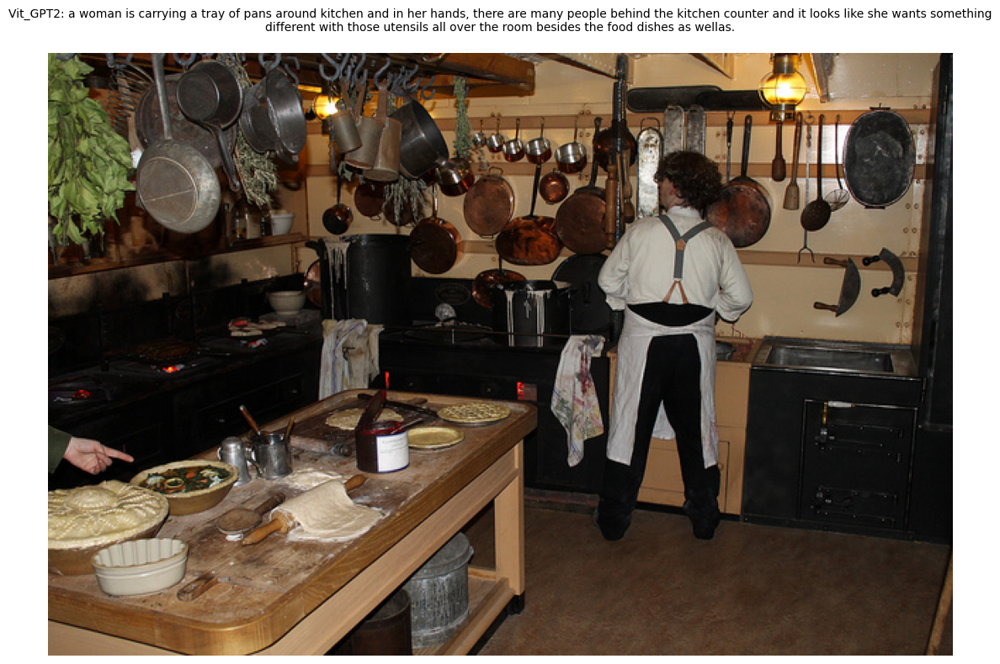


------------------------------------------------------------

Testing Image 2: 000000037777.jpg

Testing Vit_GPT2
Loading ViT-GPT2 Model...


The following generation flags are not valid and may be ignored: ['early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


ViT-GPT2: a kitchen with oak cabinets and marble flooring iced coffee, fruit drinkers on the counter tops ices.
✓ Vit_GPT2: a kitchen with oak cabinets and marble flooring iced coffee, fruit drinkers on the counter tops ices.
Vietnamese: Một nhà bếp với tủ gỗ sồi và cà phê đá cẩm thạch, những người uống trái cây trên mặt bàn.
--------------------------------------------------

--- Ground Truth Captions ---
  GT1: The dining table near the kitchen has a bowl of fruit on it.
  GT2: A small kitchen has various appliances and a table.
  GT3: The kitchen is clean and ready for us to see.
  GT4: A kitchen and dining area decorated in white.
  GT5: A kitchen that has a bowl of fruit on the table.

--- Model Results ---
  Vit_GPT2: a kitchen with oak cabinets and marble flooring iced coffee, fruit drinkers on the counter tops ices.


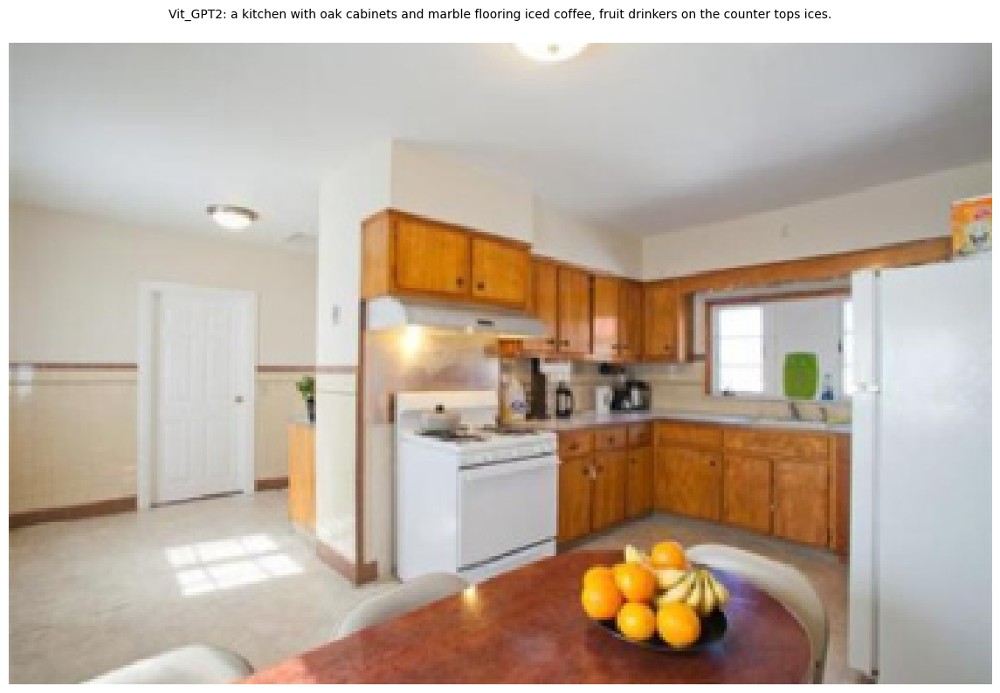


------------------------------------------------------------

Testing Image 3: 000000252219.jpg

Testing Vit_GPT2
Loading ViT-GPT2 Model...


The following generation flags are not valid and may be ignored: ['early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


ViT-GPT2: a man walking away from his cell phone near a construction site iannathan moyer in front of an american flag sign at street corner on the sidewalk beside shopping center lobby signs which reads "unions for people to eat with no pay.
✓ Vit_GPT2: a man walking away from his cell phone near a construction site iannathan moyer in front of an american flag sign at street corner on the sidewalk beside shopping center lobby signs which reads "unions for people to eat with no pay.
Vietnamese: Một người đàn ông đi ra khỏi điện thoại di động của anh ta gần một công trường xây dựng Iannathan Moyer trước một biển báo cờ Mỹ ở góc phố trên vỉa hè bên cạnh các dấu hiệu của trung tâm mua sắm có nội dung "công đoàn cho mọi người ăn mà không phải trả tiền.
--------------------------------------------------

--- Ground Truth Captions ---
  GT1: a person with a shopping cart on a city street
  GT2: City dwellers walk by as a homeless man begs for cash.
  GT3: People walking past a homeless man b

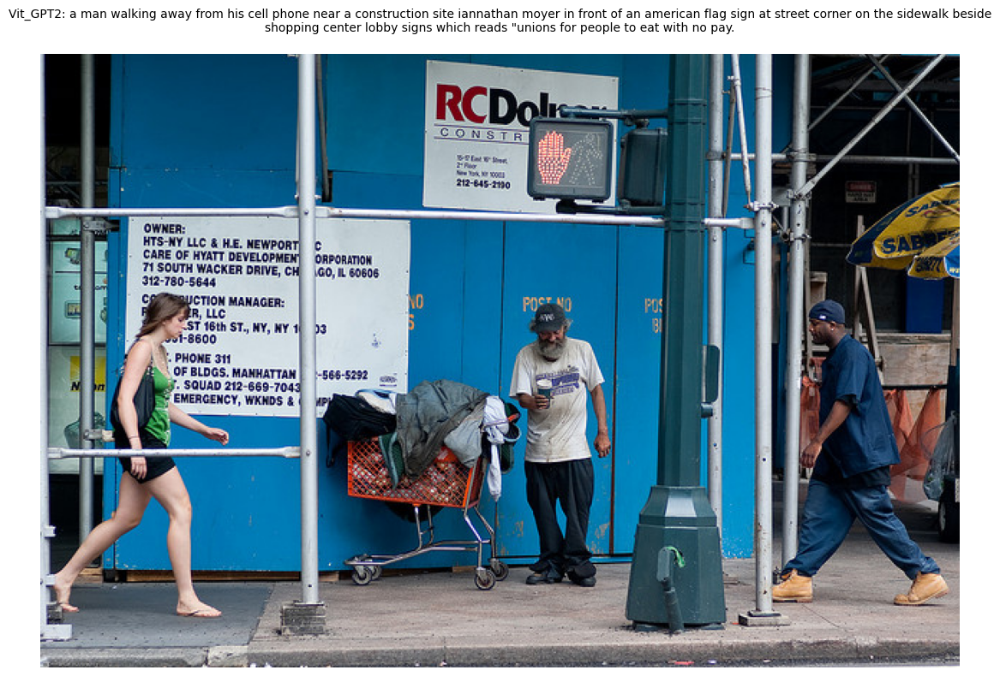


------------------------------------------------------------

Testing Image 4: 000000087038.jpg

Testing Vit_GPT2
Loading ViT-GPT2 Model...


The following generation flags are not valid and may be ignored: ['early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


ViT-GPT2: a skateboarder doing a trick in front of several people skateboarding on street at night as onlookers watch below while the camera zooms overhead by houses with no buildings nearby, graffiti everywhere and many cars are parked near or behind them.
✓ Vit_GPT2: a skateboarder doing a trick in front of several people skateboarding on street at night as onlookers watch below while the camera zooms overhead by houses with no buildings nearby, graffiti everywhere and many cars are parked near or behind them.
Vietnamese: Một người trượt ván đang thực hiện một mẹo trước một số người trượt trên đường vào ban đêm khi người xem xem bên dưới trong khi máy ảnh phóng to trên đầu bởi những ngôi nhà không có tòa nhà gần đó, graffiti ở khắp mọi nơi và nhiều chiếc xe đang đỗ gần hoặc phía sau họ.
--------------------------------------------------

--- Ground Truth Captions ---
  GT1: A person on a skateboard and bike at a skate park.
  GT2: A man on a skateboard performs a trick at the skate p

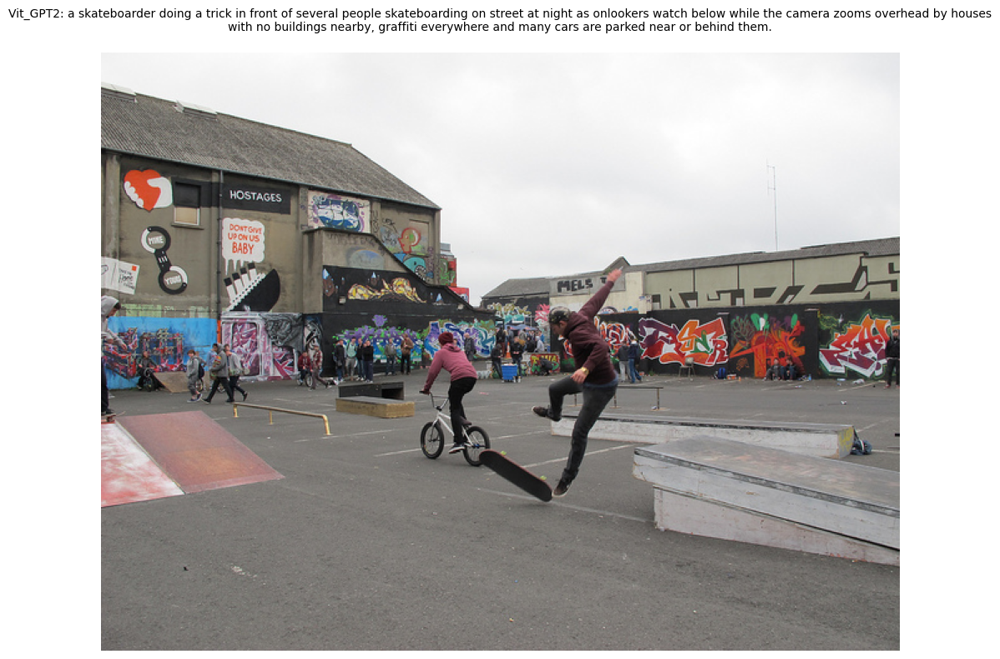


------------------------------------------------------------

Testing Image 5: 000000174482.jpg

Testing Vit_GPT2
Loading ViT-GPT2 Model...


The following generation flags are not valid and may be ignored: ['early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


ViT-GPT2: a bicycle is parked by a pole on the street bikes are near a parking spot as cars drive next to the curb.the bike is blue and white of course.
✓ Vit_GPT2: a bicycle is parked by a pole on the street bikes are near a parking spot as cars drive next to the curb.the bike is blue and white of course.
Vietnamese: Một chiếc xe đạp được đỗ bởi một cây cột trên xe đạp đường phố gần chỗ đậu xe khi những chiếc xe lái bên cạnh lề đường. Tất nhiên là chiếc xe đạp có màu xanh và trắng.
--------------------------------------------------

--- Ground Truth Captions ---
  GT1: a blue bike parked on a side walk
  GT2: A bicycle is chained to a fixture on a city street
  GT3: A blue bicycle sits on a sidewalk near a street.
  GT4: A bicycle is locked up to a post
  GT5: a bike sits parked next to a street

--- Model Results ---
  Vit_GPT2: a bicycle is parked by a pole on the street bikes are near a parking spot as cars drive next to the curb.the bike is blue and white of course.


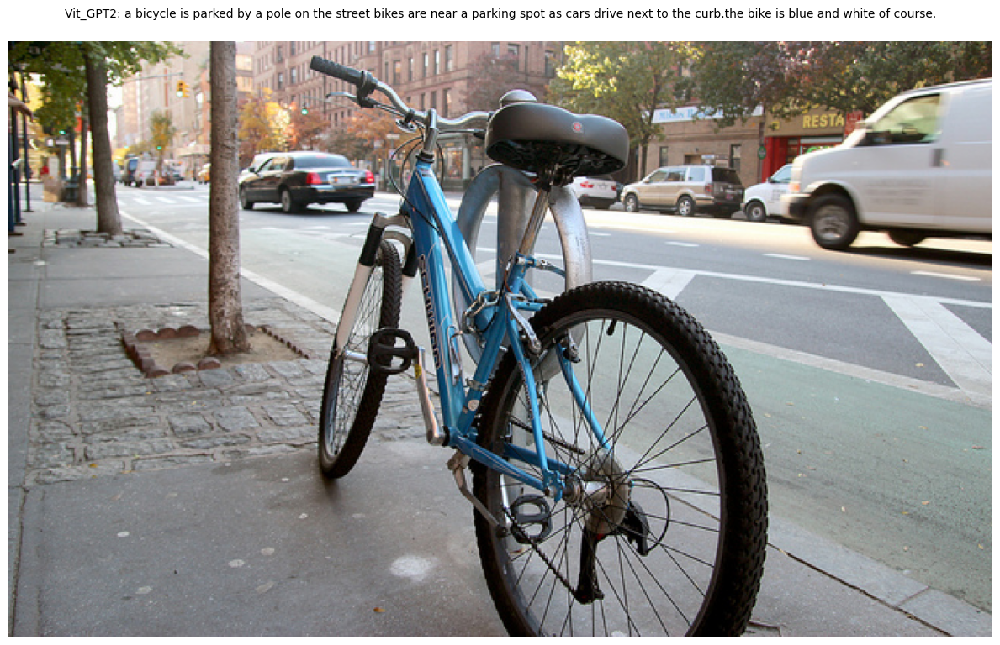


------------------------------------------------------------

Testing Image 6: 000000403385.jpg

Testing Vit_GPT2
Loading ViT-GPT2 Model...


The following generation flags are not valid and may be ignored: ['early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


ViT-GPT2: modern bathroom with toilet and bathtub, towel rack in each tub a restroom area.
✓ Vit_GPT2: modern bathroom with toilet and bathtub, towel rack in each tub a restroom area.
Vietnamese: Phòng tắm hiện đại với nhà vệ sinh và bồn tắm, giá khăn trong mỗi bồn tắm một khu vực phòng vệ sinh.
--------------------------------------------------

--- Ground Truth Captions ---
  GT1: A bathroom that has a broken wall in the shower.
  GT2: A bathroom looks clean but is missing tile at the shower stall.
  GT3: A view of a bathroom that needs to be fixed up.
  GT4: a shower toilet and sink in a basement bathroom
  GT5: A very big whit rest room with a shabby looking shower.

--- Model Results ---
  Vit_GPT2: modern bathroom with toilet and bathtub, towel rack in each tub a restroom area.


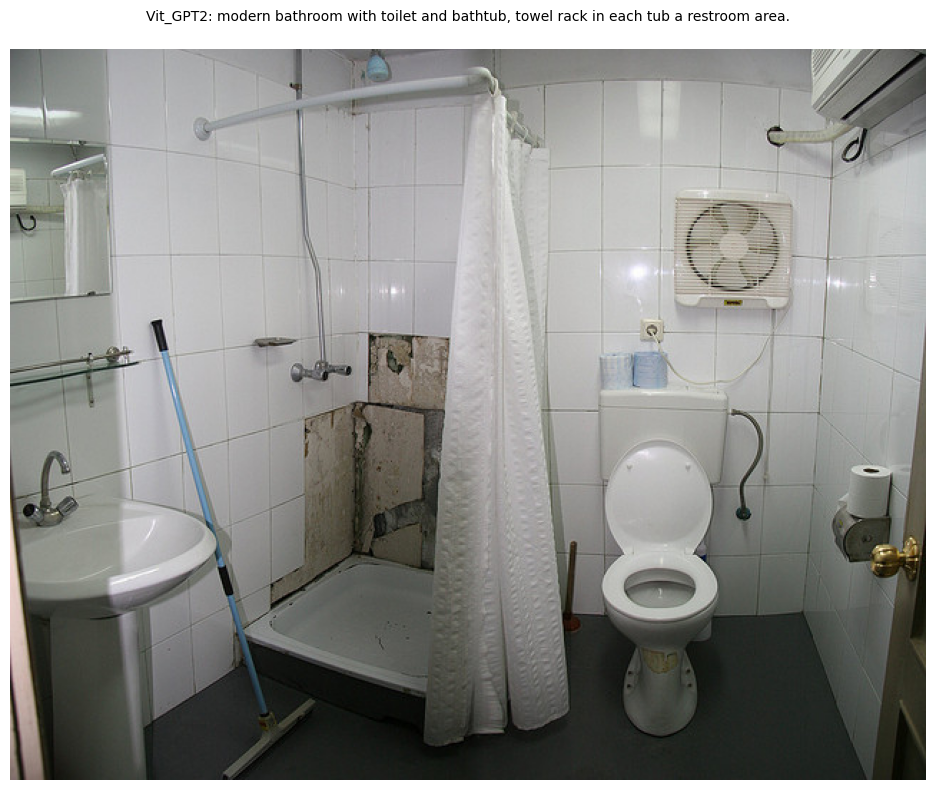


------------------------------------------------------------

Testing Image 7: 000000006818.jpg

Testing Vit_GPT2
Loading ViT-GPT2 Model...


The following generation flags are not valid and may be ignored: ['early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


ViT-GPT2: a toilet with a water hose built in to it small shower stall area, next door.
✓ Vit_GPT2: a toilet with a water hose built in to it small shower stall area, next door.
Vietnamese: Một nhà vệ sinh với vòi nước được xây dựng trong khu vực phòng tắm nhỏ, bên cạnh.
--------------------------------------------------

--- Ground Truth Captions ---
  GT1: a couple of buckets in a white room
  GT2: A bathroom with no toilets and a red and green bucket.
  GT3: a shower room with two buckets, tolet paper holder and soap.
  GT4: A standing toilet in a bathroom next to a window.
  GT5: This picture looks like a janitors closet with buckets on the floor.

--- Model Results ---
  Vit_GPT2: a toilet with a water hose built in to it small shower stall area, next door.


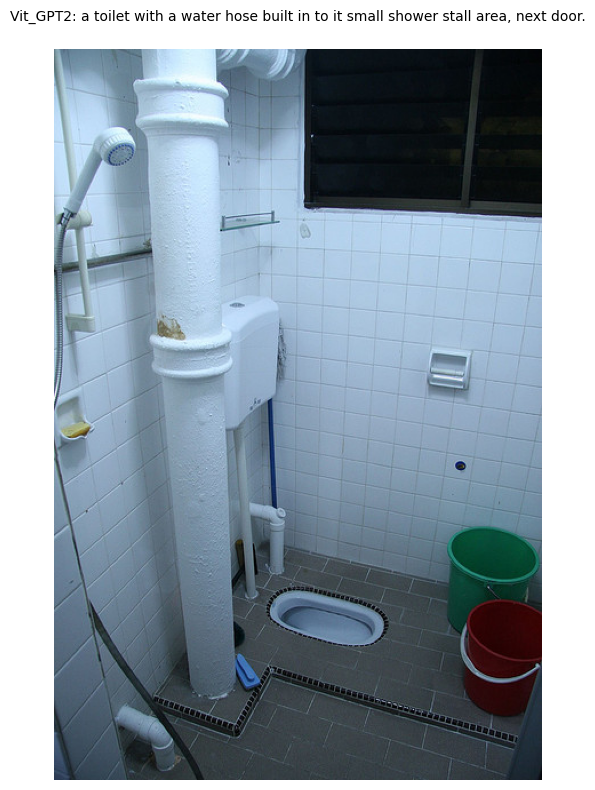


------------------------------------------------------------

Testing Image 8: 000000480985.jpg

Testing Vit_GPT2
Loading ViT-GPT2 Model...


The following generation flags are not valid and may be ignored: ['early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


ViT-GPT2: a motorcycle with a unique handlebar on display in a market lazy day of activity at the show space ...
✓ Vit_GPT2: a motorcycle with a unique handlebar on display in a market lazy day of activity at the show space ...
Vietnamese: Một chiếc xe máy có tay cầm độc đáo được trưng bày trong một ngày hoạt động của thị trường tại không gian chương trình ...
--------------------------------------------------

--- Ground Truth Captions ---
  GT1: The shiny motorcycle has been put on display.
  GT2: The new motorcycle on display is very shiny.
  GT3: A motorcycle is parked inside of a building.
  GT4: A brand new motorcycle on display at a show.
  GT5: The front end of a red motorcycle that is on display.

--- Model Results ---
  Vit_GPT2: a motorcycle with a unique handlebar on display in a market lazy day of activity at the show space ...


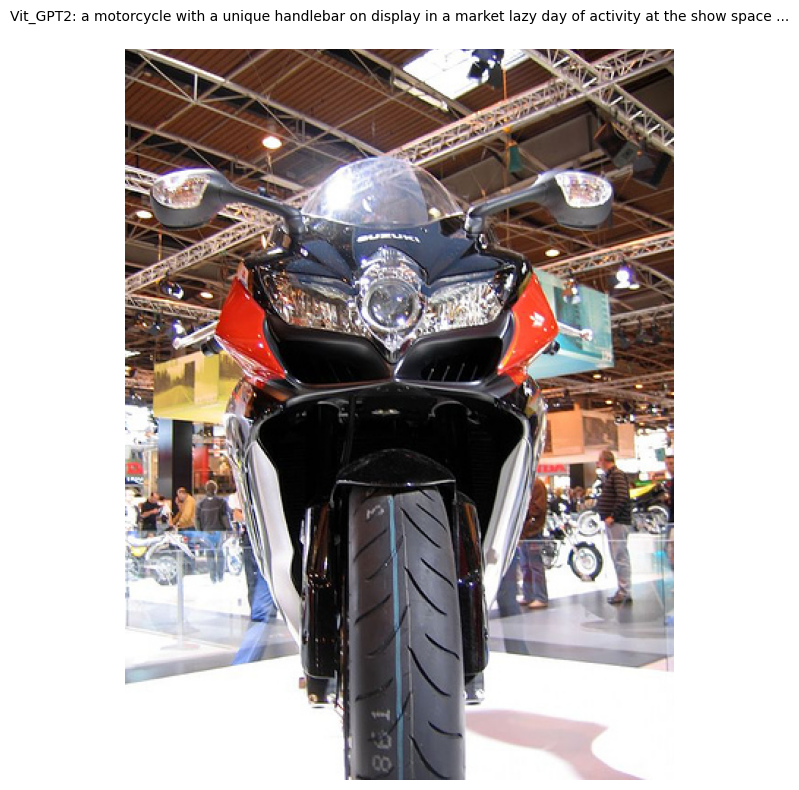


------------------------------------------------------------

Testing Image 9: 000000458054.jpg

Testing Vit_GPT2
Loading ViT-GPT2 Model...


The following generation flags are not valid and may be ignored: ['early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


ViT-GPT2: a row of toilets along a wall in mud ian background with many yellow toilet paper drenched up underneath the litter cans on either side.
✓ Vit_GPT2: a row of toilets along a wall in mud ian background with many yellow toilet paper drenched up underneath the litter cans on either side.
Vietnamese: Một hàng nhà vệ sinh dọc theo một bức tường trong nền Ian với nhiều giấy vệ sinh màu vàng nhúng xuống bên dưới lon rác ở hai bên.
--------------------------------------------------

--- Ground Truth Captions ---
  GT1: A row of white toilets sitting on top of a dirt ground.
  GT2: A bunch of dirty looking white toilets in a row outside.
  GT3: There is a row of used and broken toilets in a field.
  GT4: A row of toilets with broken seat tops on the ground.
  GT5: LOTS OF BROKEN TOILETS SITTING OUT ON A LAWN

--- Model Results ---
  Vit_GPT2: a row of toilets along a wall in mud ian background with many yellow toilet paper drenched up underneath the litter cans on either side.


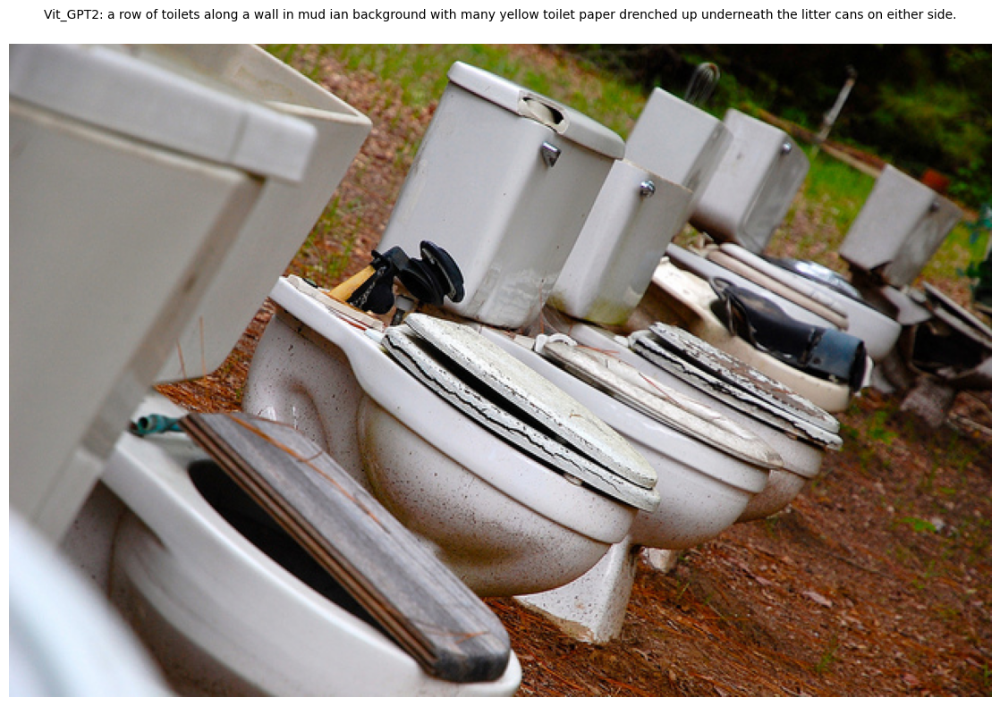


------------------------------------------------------------

Testing Image 10: 000000331352.jpg

Testing Vit_GPT2
Loading ViT-GPT2 Model...


The following generation flags are not valid and may be ignored: ['early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


ViT-GPT2: a white toilet is sitting inside of a bathroom sink.
✓ Vit_GPT2: a white toilet is sitting inside of a bathroom sink.
Vietnamese: Một nhà vệ sinh màu trắng đang ngồi bên trong bồn rửa phòng tắm.
--------------------------------------------------

--- Ground Truth Captions ---
  GT1: A small closed toilet in a cramped space.
  GT2: A tan toilet and sink combination in a small room.
  GT3: This is an advanced toilet with a sink and control panel.
  GT4: A close-up picture of a toilet with a fountain.
  GT5: Off white toilet with a faucet and controls.

--- Model Results ---
  Vit_GPT2: a white toilet is sitting inside of a bathroom sink.


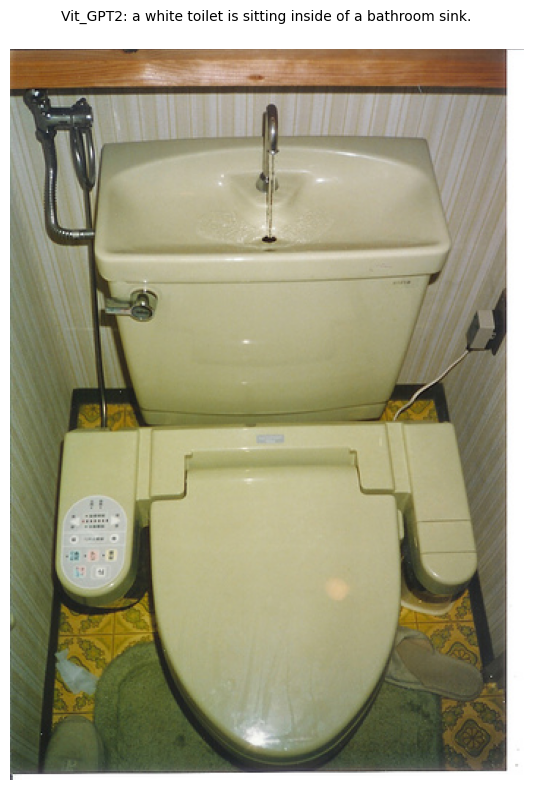


------------------------------------------------------------


{'image_1': {'image_path': 'coco_sample/images/000000397133.jpg',
  'image_name': '000000397133.jpg',
  'models_tested': ['vit_gpt2'],
  'ground_truth': ['A man is in a kitchen making pizzas.',
   'Man in apron standing on front of oven with pans and bakeware',
   'A baker is working in the kitchen rolling dough.',
   'A person standing by a stove in a kitchen.',
   'A table with pies being made and a person standing near a wall with pots and pans hanging on the wall.'],
  'model_results': {'Vit_GPT2': 'a woman is carrying a tray of pans around kitchen and in her hands, there are many people behind the kitchen counter and it looks like she wants something different with those utensils all over the room besides the food dishes as wellas.'},
  'num_ground_truth': 5},
 'image_2': {'image_path': 'coco_sample/images/000000037777.jpg',
  'image_name': '000000037777.jpg',
  'models_tested': ['vit_gpt2'],
  'ground_truth': ['The dining table near the kitchen has a bowl of fruit on it.',
   'A 

In [41]:
generate_image_captions(local_ground_truth,['vit_gpt2'])